In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.feature_selection import RFE

1. Считать в `pandas.DataFrame` любой источник данных: CSV, JSON, Excel-файл, HTML-таблицу и т.п.
   > Датасет должен содержать как минимум количественные признаки. Если категориальных нет, то пропустить пункты с временным убиранием категориальных признаков. Желательно наличие обоих типов признаков в датасете.


In [26]:
# Загрузка датасета
df = pd.read_csv("../dataset/Score.csv")

2. Датасет и подготовка данных, этап 1:
   - Привести описание датасета.
   - Осуществить предобработку данных (избавиться от `null`, убрать некоторые признаки и т.п.) - "подчистить данные".
   - Нормализовать численные данные.
   - Визуализировать `heatmap`-матрицу кореллированности признаков.
   - Визуализировать взаимосвязь между `target`-переменной и каждым из признаком (с использованием `srs.pairplot` или `pandas.plotting.scatter_matrix`). Лучше всего построить диаграмму попарного распределения между таргетом и каждым из признаков отдельно (пример с `sns.FacetGrid` в лекции).
   - Разбить выборку на обучающую и тестовую.
     > Из датафреймов обучающей и тестовой выборки необходимо временно убрать категориальные признаки (исходные датафреймы сохранить для 2 этапа).

In [53]:
df.describe()

,Delay_from_due_date,Num_of_Delayed_Payment,Num_Credit_Inquiries,Credit_Utilization_Ratio,Credit_History_Age,Amount_invested_monthly,Monthly_Balance,Age,Annual_Income,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Monthly_Inhand_Salary,Changed_Credit_Limit,Outstanding_Debt,Total_EMI_per_month
count,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000,99960.000000
mean,0.314861,0.476298,0.199123,0.409485,0.546210,0.097943,0.251828,0.458791,0.251430,0.536887,0.502987,14.535174,0.392664,0.261269,0.335718,0.285380,0.059337
std,0.221305,0.223927,0.133180,0.170563,0.247385,0.098508,0.133822,0.256247,0.221378,0.259167,0.187973,8.741047,0.271795,0.213846,0.220856,0.231150,0.070722
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.149254,0.321429,0.103448,0.268402,0.354839,0.037277,0.168729,0.238095,0.071294,0.300000,0.363636,7.000000,0.222222,0.088783,0.169607,0.113219,0.016331
50%,0.268657,0.500000,0.172414,0.410182,0.540943,0.065413,0.210501,0.452381,0.173376,0.500000,0.454545,13.000000,0.333333,0.187084,0.299864,0.233349,0.037130
75%,0.417910,0.642857,0.275862,0.549877,0.746898,0.118505,0.294561,0.666667,0.373887,0.700000,0.636364,20.000000,0.555556,0.379443,0.481004,0.389762,0.081831
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,34.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [28]:
# Удаление пропущенных значений
df.dropna(inplace=True)

# Удалим некоррелирующие или идентификаторы
if 'ID' in df.columns:
    df.drop(columns=['ID'], inplace=True)

In [29]:
# Нормализация числовых признаков
numeric_target = 'Interest_Rate'
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.drop(numeric_target).tolist()
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

categorical_cols.remove('Credit_Score')

scaler = MinMaxScaler()
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

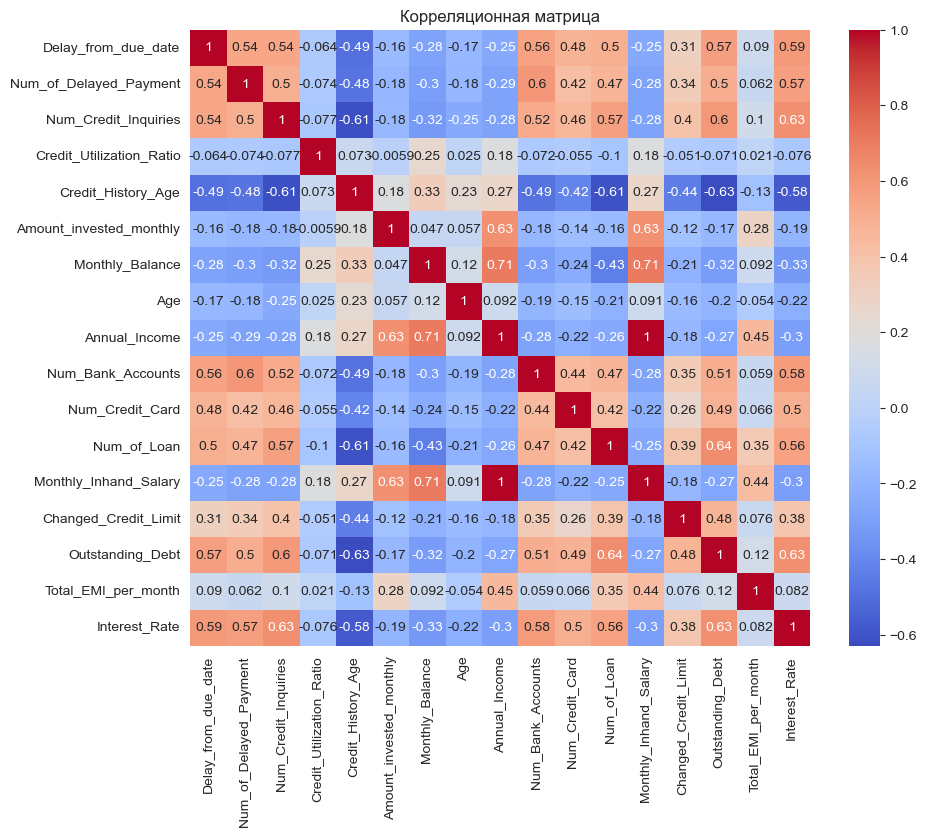

In [30]:
#  Визуализация heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df[numeric_cols + [numeric_target]].corr(), annot=True, cmap='coolwarm')
plt.title('Корреляционная матрица')
plt.show()


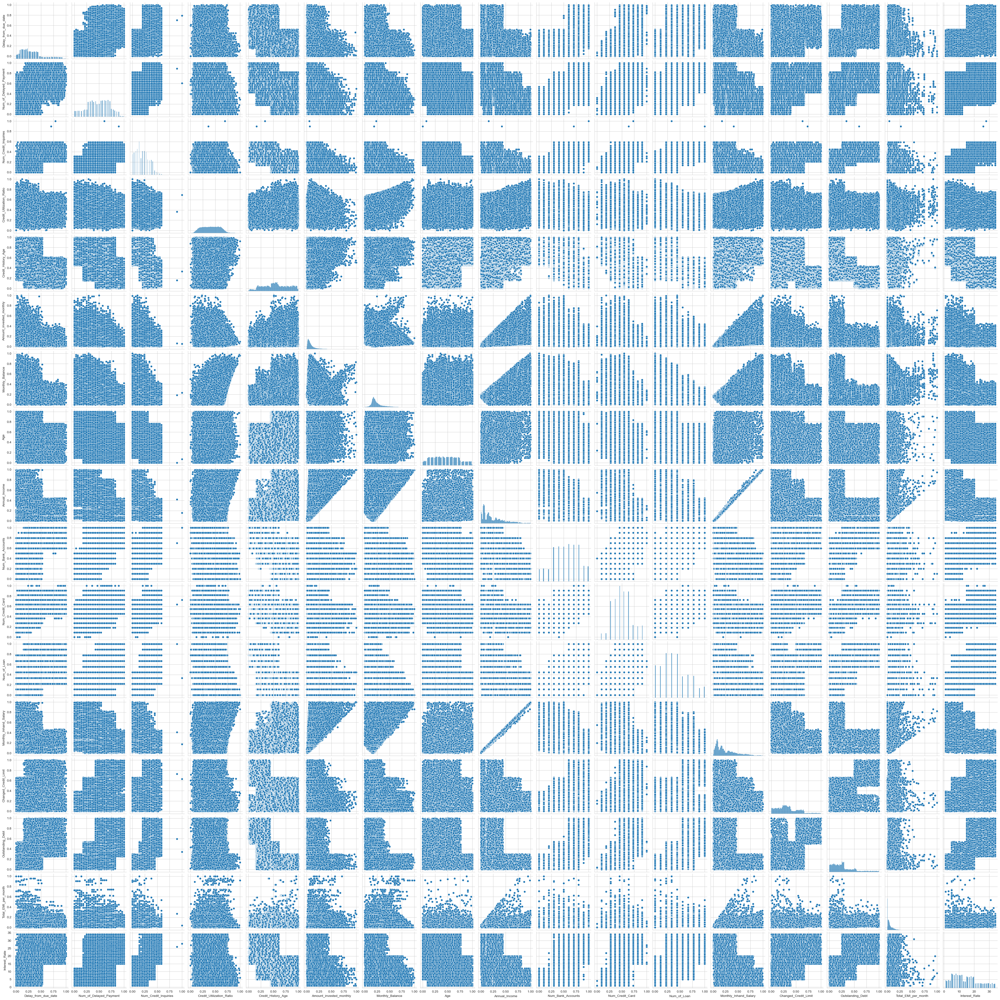

In [31]:
# Визуализация зависимостей признаков от целевой переменной
sns.pairplot(df[numeric_cols + [numeric_target]])
plt.show()

In [32]:
# Разделение на train/test + удаление категориальных признаков
X = df[numeric_cols]
y = df[numeric_target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

3. Регрессия МНК:
   - Обучить модель линейной регрессии `LinearRegression`.
   - Вывести метрики $MSE$, $MAE$ и $R^2$ на тестовом наборе.
   - Вывести `model.coef_` и `model.intercept_`.
   - Построить график (`barh`) с важностью коэфициентов при соответствующих признаках (сверху вниз расположены коэффициенты по убыванию, а названия соответствующих признаков подписаны по вертикальной оси).


In [33]:
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

# Метрики
print("MSE:", mean_squared_error(y_test, y_pred))
print("MAE:", mean_absolute_error(y_test, y_pred))
print("R^2:", r2_score(y_test, y_pred))

# Коэффициенты
print("Intercept:", lr.intercept_)
print("Coefficients:", dict(zip(X.columns, lr.coef_)))


MSE: 31.53486812651859
MAE: 4.594120544075956
R^2: 0.582816592329132
Intercept: 3.0958480531574484
Coefficients: {'Delay_from_due_date': 4.733015068875003, 'Num_of_Delayed_Payment': 4.7341872259331605, 'Num_Credit_Inquiries': 13.14294168839211, 'Credit_Utilization_Ratio': 0.18399575628928555, 'Credit_History_Age': -2.781273807842758, 'Amount_invested_monthly': 0.26840018792762077, 'Monthly_Balance': 0.5466345878251053, 'Age': -0.5596837860294248, 'Annual_Income': 1.9919298383459942, 'Num_Bank_Accounts': 4.618501486301704, 'Num_Credit_Card': 3.941480459701936, 'Num_of_Loan': 2.168539938501912, 'Monthly_Inhand_Salary': -3.8521536634429094, 'Changed_Credit_Limit': 0.40718862724304916, 'Outstanding_Debt': 6.1118593769146745, 'Total_EMI_per_month': -1.1048009071916638}


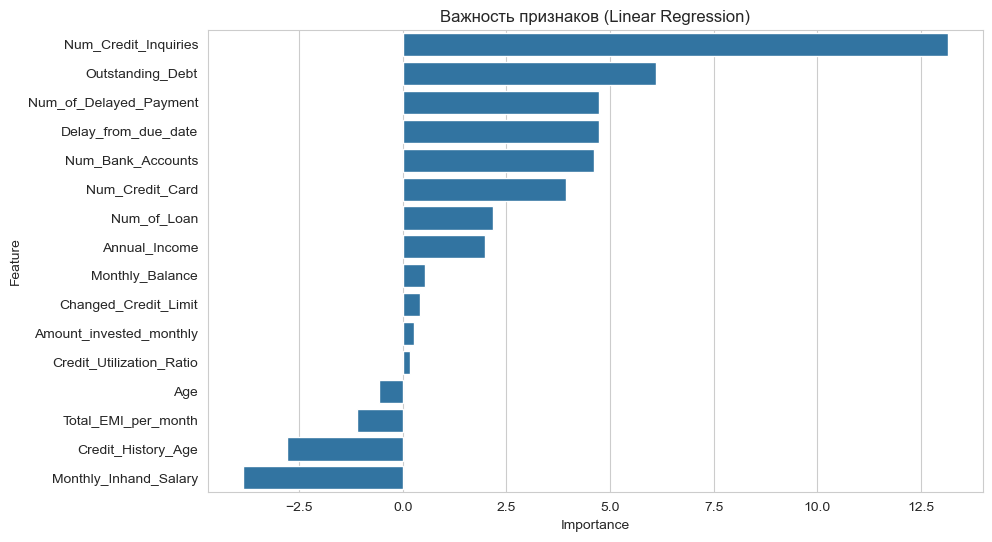

In [34]:
# График важности признаков
coef_df = pd.DataFrame({'Feature': X.columns, 'Importance': lr.coef_})
coef_df = coef_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=coef_df, y='Feature', x='Importance', orient='h')
plt.title('Важность признаков (Linear Regression)')
plt.show()

4. Для каждого вида регрессии (`Ridge`, `LASSO`, `Elastic Net`):
   - С использованием `GridSearchCV` осуществить подбор параметров регуляризации (`alpha` для `Ridge` и `LASSO`, `alpha` и `l1_ratio` для `Elastic Net`)
   - Вывести значения гиперпараметров, коэффициенты регрессии (`model.coef_` и `model.intercept_`) и значения метрик на тестовом наборе для наилучшей модели ($MSE$, $MAE$ и $R^2$).
   - Построить график (`barh`) с важностью коэфициентов при соответствующих признаках (сверху вниз расположены коэффициенты по убыванию, а названия соответствующих признаков подписаны по вертикальной оси).

   > Запомнить лучшие модели для 2 этапа.


Ridge
Best Params: {'alpha': 1}
MSE: 31.535581304106174
MAE: 4.594181423137062
R^2: 0.5828071575074905


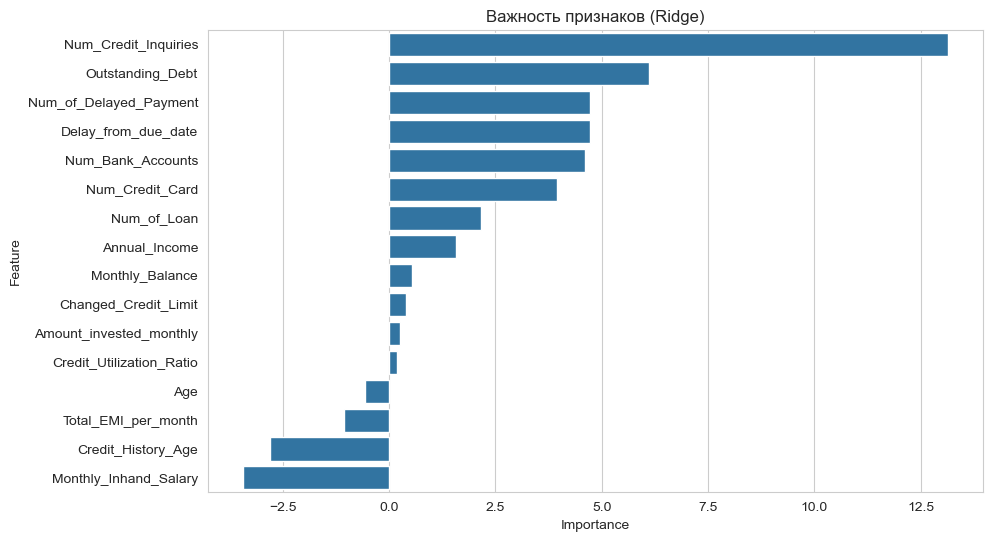


LASSO
Best Params: {'alpha': 0.01}
MSE: 31.545179638174808
MAE: 4.595518580198046
R^2: 0.5826801785171661


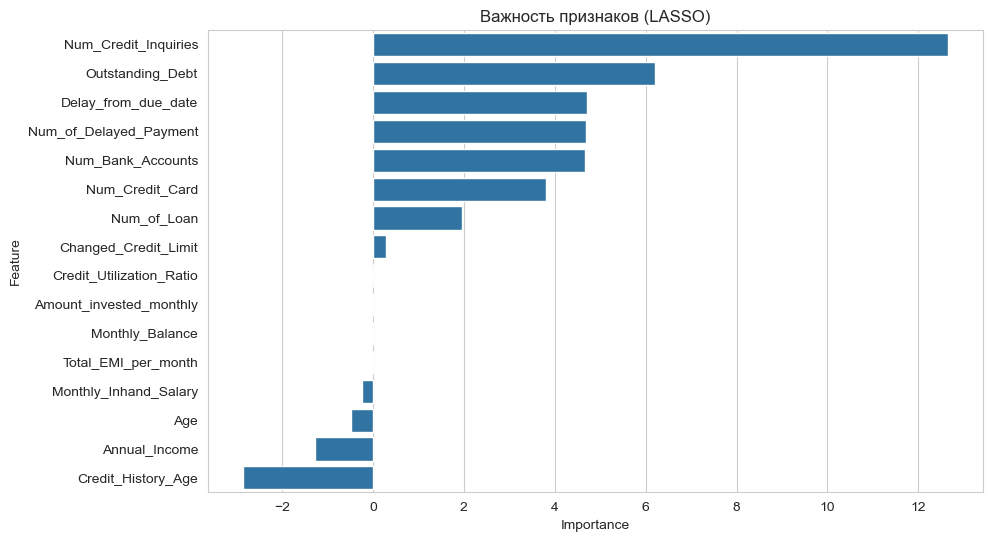


ElasticNet
Best Params: {'alpha': 0.01, 'l1_ratio': 0.8}
MSE: 31.594567862451726
MAE: 4.5997420285431785
R^2: 0.5820268081710466


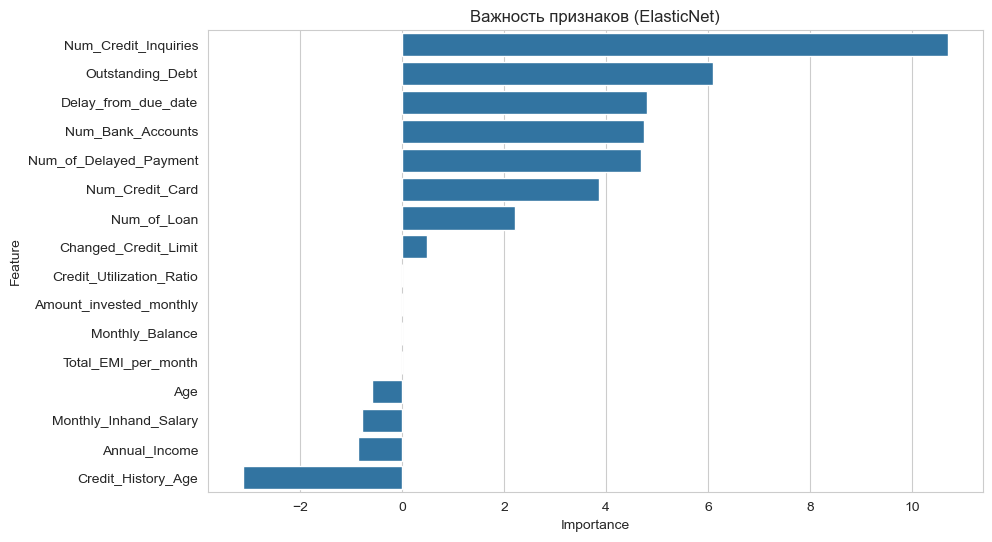

In [35]:
def run_regression(model, param_grid, name):
    grid = GridSearchCV(model, param_grid, cv=5)
    grid.fit(X_train, y_train)
    y_pred = grid.predict(X_test)

    print(f"\n{name}")
    print("Best Params:", grid.best_params_)
    print("MSE:", mean_squared_error(y_test, y_pred))
    print("MAE:", mean_absolute_error(y_test, y_pred))
    print("R^2:", r2_score(y_test, y_pred))

    coef_df = pd.DataFrame({
        'Feature': X.columns,
        'Importance': grid.best_estimator_.coef_
    }).sort_values(by='Importance', ascending=False)

    plt.figure(figsize=(10, 6))
    sns.barplot(data=coef_df, y='Feature', x='Importance', orient='h')
    plt.title(f'Важность признаков ({name})')
    plt.show()

    return grid.best_estimator_

ridge = run_regression(Ridge(), {'alpha': [0.01, 0.1, 1, 10]}, 'Ridge')
lasso = run_regression(Lasso(), {'alpha': [0.01, 0.1, 1, 10]}, 'LASSO')
elastic = run_regression(ElasticNet(), {
    'alpha': [0.01, 0.1, 1],
    'l1_ratio': [0.2, 0.5, 0.8]
}, 'ElasticNet')


5. Датасет и подготовка данных, этап 2:
   - Использовать датафреймы после разбиения на обучающую и тестовую выборки из 1 этапа с категориальными признаками.
   - Закодировать категориальные признаки в обучающей и тестовой выборках.

In [40]:
X = df.drop(columns=["Interest_Rate"])  # Убираем целевую переменную
y = df["Interest_Rate"]  # Целевая переменная — числовая

# 7. Разделение на категориальные и числовые признаки
X_num = X.select_dtypes(include=["int64", "float64"])
X_cat = X.select_dtypes(include=["object"])

# 8. Кодирование категориальных признаков
X_cat_encoded = pd.get_dummies(X_cat, drop_first=True)

# 9. Объединение числовых и закодированных категориальных признаков
X_final = pd.concat([X_num, X_cat_encoded], axis=1)

# 10. Разделение на обучающую и тестовую выборки
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X_final, y, test_size=0.2, random_state=42
)

6. Регрессии, этап 2:
   - Обучить `LinearRegression`, лучшие модели `Ridge`, `LASSO`, `Elastic Net` на обучающем наборе с категориальными признаками.
   - Вывести значения гиперпараметров, коэффициенты регрессии (`model.coef_` и `model.intercept_`) и значения метрик на тестовом наборе ($MSE$, $MAE$ и $R^2$).
   - Сравнить метрики с наличием категориальных признаков и без для каждой из моделей.
   - Выбрать лучшую модель.
   - Построить график (`barh`) с важностью коэфициентов при соответствующих признаках (сверху вниз расположены коэффициенты по убыванию, а названия соответствующих признаков подписаны по вертикальной оси).
   - Осуществить фильтрацию признаков с использованием `Recursive Feature Elimination`.
   - Построить график (`barh`) с важностью коэфициентов при соответствующих признаках (сверху вниз расположены коэффициенты по убыванию, а названия соответствующих признаков подписаны по вертикальной оси).
   - Вывести значения метрик на тестовом наборе ($MSE$, $MAE$ и $R^2$).

In [48]:
def evaluate_model(name, model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"\n{name}:")
    print("MSE:", mean_squared_error(y_test, y_pred))
    print("MAE:", mean_absolute_error(y_test, y_pred))
    print("R²:", r2_score(y_test, y_pred))

    # Важность признаков — коэффициенты модели
    coefs = model.coef_
    feature_names = X_train.columns

    # Сортируем по абсолютному значению коэффициентов, убывание
    sorted_idx = np.argsort(coefs)[::-1]
    sorted_coefs = coefs[sorted_idx]
    sorted_features = feature_names[sorted_idx]

    plt.figure(figsize=(8, 10))
    plt.barh(range(len(sorted_coefs)), sorted_coefs, align='center')
    plt.yticks(range(len(sorted_coefs)), sorted_features)
    plt.gca().invert_yaxis()
    plt.xlabel("Значение коэффициента")
    plt.title(f"{name} — важность коэффициентов признаков")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


Linear Regression:
MSE: 28.01526569759588
MAE: 4.3417015314734675
R²: 0.6293783768608989


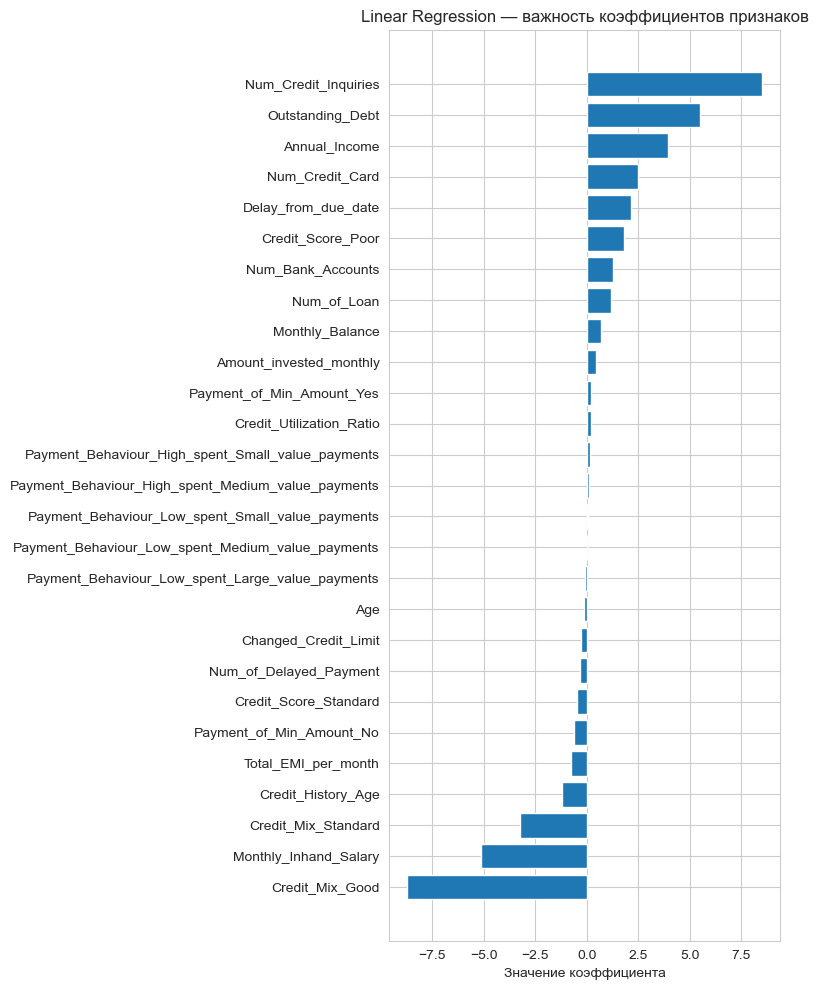


Ridge:
MSE: 28.016521948911336
MAE: 4.341859419746781
R²: 0.6293617575681665


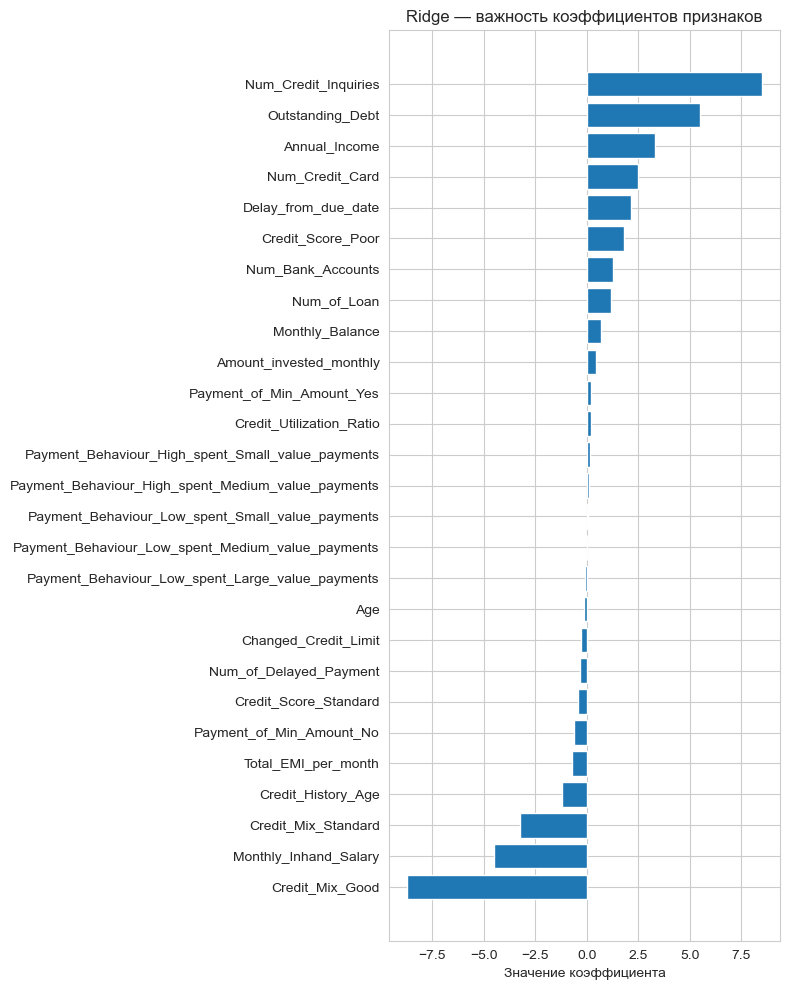


LASSO:
MSE: 28.73523591936359
MAE: 4.3783687903381105
R²: 0.6198536936012906


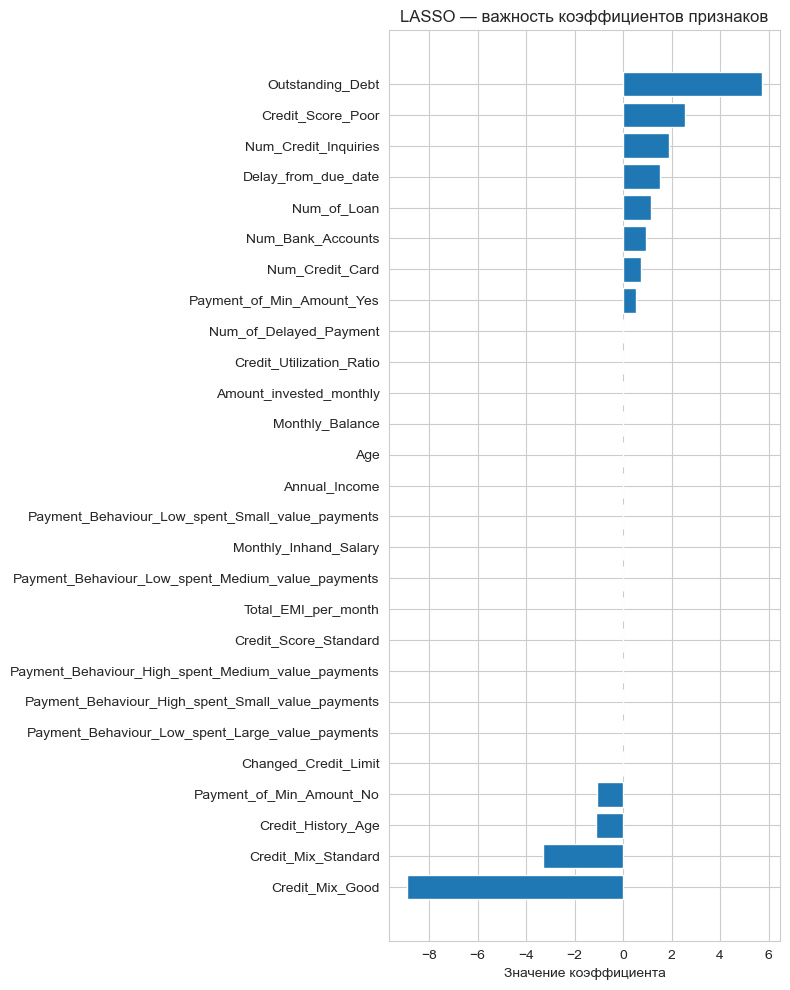

In [49]:
# Обучение моделей
ridge = Ridge(alpha=1.0)
lasso = Lasso(alpha=0.1)

# 13. Оценка моделей
evaluate_model("Linear Regression", LinearRegression(), X_train, X_test, y_train, y_test)
evaluate_model("Ridge", ridge, X_train, X_test, y_train, y_test)
evaluate_model("LASSO", lasso, X_train, X_test, y_train, y_test)


RFE Linear Regression:
MSE: 28.124258597059473
MAE: 4.344976863658661
R²: 0.6279364799413454


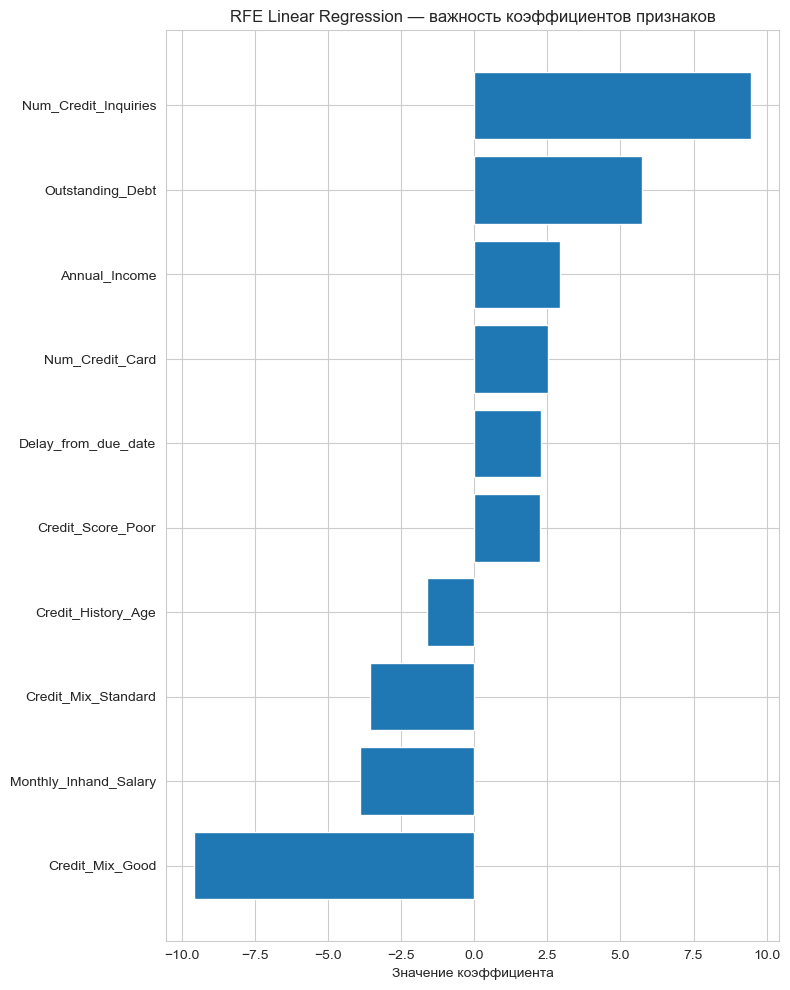

In [50]:
rfe = RFE(estimator=LinearRegression(), n_features_to_select=10)
rfe.fit(X_train, y_train)
X_train_rfe = X_train.loc[:, rfe.support_]
X_test_rfe = X_test.loc[:, rfe.support_]

evaluate_model("RFE Linear Regression", LinearRegression(), X_train_rfe, X_test_rfe, y_train, y_test)


RFE Ridge:
MSE: 28.12502963244661
MAE: 4.34509615153182
R²: 0.6279262797030267


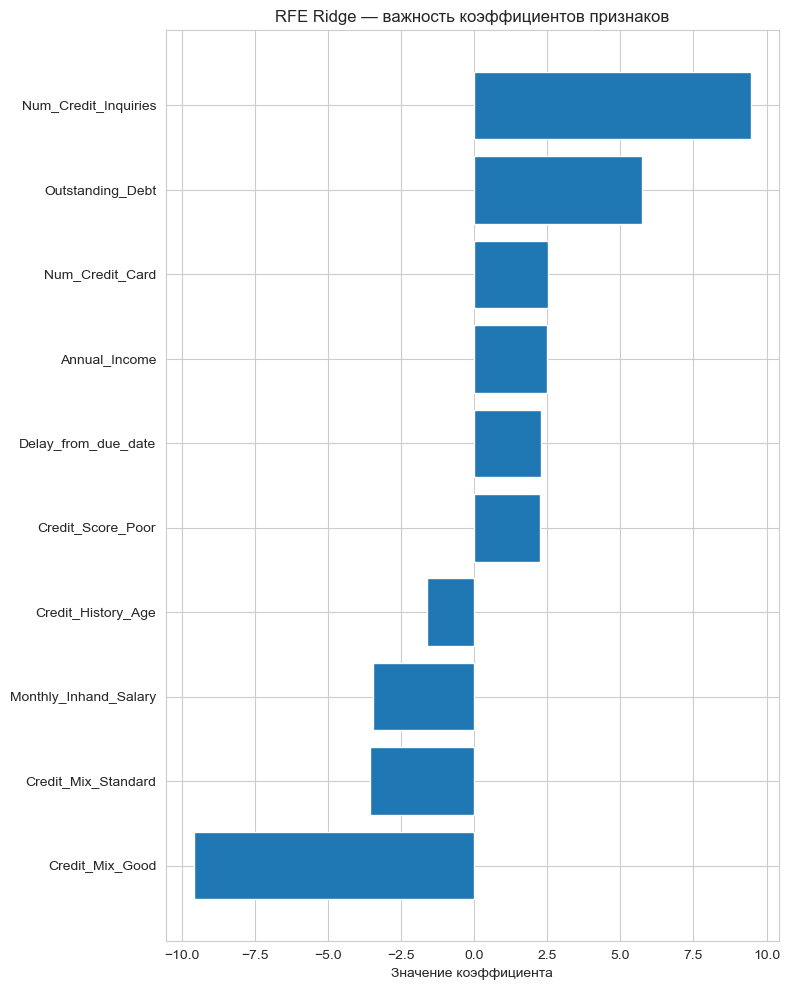

In [51]:
rfe = RFE(estimator = Ridge(alpha=1.0), n_features_to_select=10)
rfe.fit(X_train, y_train)
X_train_rfe = X_train.loc[:, rfe.support_]
X_test_rfe = X_test.loc[:, rfe.support_]

evaluate_model("RFE Ridge", Ridge(alpha=1.0), X_train_rfe, X_test_rfe, y_train, y_test)


RFE Lasso:
MSE: 28.79535371178886
MAE: 4.38179018117892
R²: 0.6190583788593675


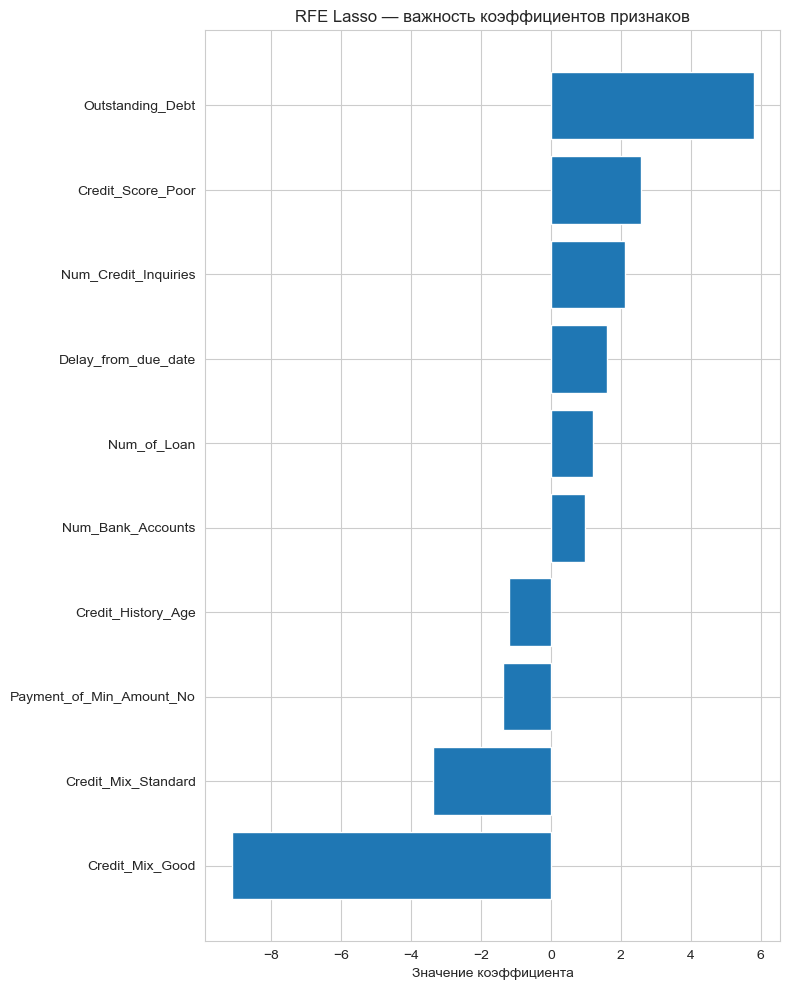

In [52]:
rfe = RFE(estimator = Lasso(alpha=0.1), n_features_to_select=10)
rfe.fit(X_train, y_train)
X_train_rfe = X_train.loc[:, rfe.support_]
X_test_rfe = X_test.loc[:, rfe.support_]

evaluate_model("RFE Lasso", Lasso(alpha=0.1), X_train_rfe, X_test_rfe, y_train, y_test)

7. Сделать вывод:
   - Лучший регрессор, обученный на данных без категориальных признаков (значения метрик на тестовом наборе).
   - Лучший регрессор, обученный на данных с категориальными признаками (значения метрик на тестовом наборе).
   - Вывод о результатах использования `Recursive Feature Elimination` (лучше или хуже - значения метрик).

- Лучший регрессор без категориальных признаков — Ridge <br/>
- Лучший регрессор с категориальными признаками — Linear Regression<br/>
- Recursive Feature Elimination немного ухудшил метрики